# Simple Transfer of Facial Gestures with Appearance (Linear Algebra Project)

__Creators:__ [Mehrshad Hosseini](https://www.linkedin.com/in/mehrshadhosseini28/), [Hanie Masumi](https://www.linkedin.com/in/hanie-masumi/)

__Date:__ Feb 2022

# Downloads

In [1]:
!wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d /content/shape_predictor_68_face_landmarks.dat.bz2

--2022-03-15 08:22:22--  http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Resolving dlib.net (dlib.net)... 107.180.26.78
Connecting to dlib.net (dlib.net)|107.180.26.78|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 64040097 (61M)
Saving to: ‘shape_predictor_68_face_landmarks.dat.bz2’

shape_predictor_68_ 100%[===================>]  61.07M  79.1MB/s    in 0.8s    

2022-03-15 08:22:23 (79.1 MB/s) - ‘shape_predictor_68_face_landmarks.dat.bz2’ saved [64040097/64040097]



In [2]:
!wget https://github.com/mehrshadhosseini28/linear-algebra-project/raw/master/Mehrshad.zip
!unzip -q /content/Mehrshad.zip

!wget https://github.com/mehrshadhosseini28/linear-algebra-project/raw/master/Hanie.zip
!unzip -q /content/Hanie.zip

--2022-03-15 08:22:40--  https://github.com/mehrshadhosseini28/linear-algebra-project/raw/master/Mehrshad.zip
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/mehrshadhosseini28/linear-algebra-project/master/Mehrshad.zip [following]
--2022-03-15 08:22:40--  https://raw.githubusercontent.com/mehrshadhosseini28/linear-algebra-project/master/Mehrshad.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7656092 (7.3M) [application/zip]
Saving to: ‘Mehrshad.zip’

Mehrshad.zip        100%[===================>]   7.30M  --.-KB/s    in 0.02s   

2022-03-15 08:22:40 (295 MB/s) - ‘Mehrshad.zip’ saved [76560

# Imports

In [3]:
import cv2
import dlib
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from base64 import b64encode
from google.colab.patches import cv2_imshow
from matplotlib import rcParams, rc
from tqdm.notebook import tqdm, trange
from IPython.display import HTML
from scipy.spatial import Delaunay

rc('animation', html='jshtml')
rcParams['animation.embed_limit'] = 2**128

# Paths

In [4]:
FACE_LANDMARKS_FILE = '/content/shape_predictor_68_face_landmarks.dat'
A_IMGS = [f'/content/Mehrshad/mehrshad ({i}).jpg' for i in range(1, 68)]
A_NATURAL_IMG = A_IMGS[0]
B_NATURAL_IMG = '/content/Hanie/hanie img.jpeg'
B_VIDEO = '/content/Hanie/hanie video.mp4'

In [5]:
edges = [
    (0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6), (6, 7), (7, 8), (8, 9), (9, 10),
    (10, 11), (11, 12), (12, 13), (13, 14), (14, 15), (15, 16), (17, 18), (18, 19), (19, 20), (20, 21),
    (22, 23), (23, 24), (24, 25), (25, 26), (27, 28), (28, 29), (29, 30), (30, 33), (31, 32), (32, 33),
    (33, 34), (34, 35), (36, 37), (37, 38), (38, 39), (39, 40), (40, 41), (41, 36), (42, 43), (43, 44),
    (44, 45), (45, 46), (46, 47), (47, 42), (48, 49), (49, 50), (50, 51), (51, 52), (52, 53), (53, 54),
    (54, 55), (55, 56), (56, 57), (57, 58), (58, 59), (59, 48), (60, 61), (61, 62), (62, 63), (63, 64),
    (64, 65), (65, 66), (66, 67), (67, 60)
]

# Classes and Functions

In [22]:
class MyPlot:
    @classmethod
    def plot_face(cls, plt, X, color='b'):
        "plots a face"
        plt.plot(X[:,0], X[:,1], 'o', color=color, markersize=3)

        for e in edges:
            i,j = e
            xi = X[i,0]
            yi = X[i,1]

            xj = X[j,0]
            yj = X[j,1]

            plt.plot((xi,xj), (yi,yj), '-', color=color)

        plt.axis('square')
        return plt

    @classmethod
    def plot_all(cls, F, per_row=16):
        rcParams['figure.figsize'] = [20, 15]
        extra_ax = (per_row - 1) - ((len(F) - 1) % per_row)
        temp_F = np.concatenate((F, np.zeros((extra_ax, *F.shape[1:]))), axis=0)
        for k, x in enumerate(temp_F):
            j = k % per_row
            if j == 0:
                fig, ax = plt.subplots(1, per_row)
            cls.plot_face(ax[j], x)
        plt.show()
    
    @classmethod
    def diff_plot_all(cls, FA, FB, per_row=16):
        rcParams['figure.figsize'] = [20, 15]
        extra_ax = (per_row - 1) - ((len(FA) - 1) % per_row)
        temp_FA = np.concatenate((FA, np.zeros((extra_ax, *FA.shape[1:]))), axis=0)
        temp_FB = np.concatenate((FB, np.zeros((extra_ax, *FB.shape[1:]))), axis=0)
        for k, (xA, xB) in enumerate(zip(temp_FA, temp_FB)):
            j = k % per_row
            if j == 0:
                fig, ax = plt.subplots(1, per_row)
            cls.plot_face(ax[j], xA, color='b')
            cls.plot_face(ax[j], xB, color='r')
        plt.show()
    
    @classmethod
    def plot(cls, x):
        rcParams['figure.figsize'] = [5, 4]
        cls.plot_face(plt, x)
        plt.show()
    
    @classmethod
    def diff_plot(cls, xA, xB):
        rcParams['figure.figsize'] = [5, 4]
        cls.plot_face(plt, xA, color='b')
        cls.plot_face(plt, xB, color='r')
        plt.show()
    
    @classmethod
    def animate_plot(cls, iterF):
        fig = plt.figure(figsize=(4,3))
        ax = plt.axes()

        def temp(face):
            ax.clear()
            return cls.plot_face(ax, face, color='b')

        anim = animation.FuncAnimation(fig, temp, frames=iterF, blit=False, repeat=True)
        return anim
    
    @classmethod
    def animate_imshow(cls, iterF):
        fig = plt.figure(figsize=(4,3))
        ax = plt.axes()

        def temp(face):
            ax.clear()
            ax.imshow(face)
            return ax

        anim = animation.FuncAnimation(fig, temp, frames=iterF, blit=False, repeat=True)
        return anim

In [13]:
class FaceDetector:
    def __init__(self, landmarks_file):
        self.detector = dlib.get_frontal_face_detector()
        self.predictor = dlib.shape_predictor(landmarks_file)

    def _get_dot(self, img):
        dets = self.detector(img, 1)
        shape = self.predictor(img, dets[0])
        X = np.array([(shape.part(i).x,shape.part(i).y) for i in range(shape.num_parts)])
        X[:, 1] = -X[:, 1]
        return X

    def iter_video_dots(self, video_file):
        vc = cv2.VideoCapture(video_file)
        rval = vc.isOpened()
        if not rval:
            raise FileNotFoundError()
        i = 0
        while rval:
            rval, img = vc.read()
            if not rval:
                break
            X = self._get_dot(img)
            yield X
        return

    def iter_images_dots(self, image_files):
        for img_file in tqdm(image_files):
            img = cv2.imread(img_file, cv2.IMREAD_COLOR)
            X = self._get_dot(img)
            yield X
        return

In [14]:
class App:
    def __init__(self, face_detector, train_imgs, natural_img):
        self.FD = face_detector
        self.train_imgs = train_imgs
        self.natural_img = natural_img

    def load(self):
        self.X = np.array([d for d in self.FD.iter_images_dots(self.train_imgs)])
        self.natural_X = [d for d in self.FD.iter_images_dots([self.natural_img])][0]

        self.natural_X_mean = self.natural_X.mean(axis=0) # Use in Task 4

    def apply_mean(self):
        self.X = self.X - self.X.mean(axis=1).reshape((-1,1,2))
        self.natural_X = self.natural_X - self.natural_X.mean(axis=0).reshape((1,2))

        self.X_mean = self.X.mean(axis=0) # Use for comparison plots
    
    def get_affine_transformed(self, face):
        xx = face[:,0] @ face[:,0]
        xy = face[:,0] @ face[:,1]
        yy = face[:,1] @ face[:,1]

        xn_x = self.natural_X[:,0] @ face[:,0]
        yn_y = self.natural_X[:,1] @ face[:,1]
        xn_y = self.natural_X[:,0] @ face[:,1]
        yn_x = self.natural_X[:,1] @ face[:,0]

        G = np.array([
            [xx, xy, 0, 0],
            [xy, yy, 0, 0],
            [0, 0, xx, xy],
            [0, 0, xy, yy]
        ])
        t = [xn_x, xn_y, yn_x, yn_y]

        A = np.linalg.solve(G, t).reshape((2,2))
        transformed = (A @ face.T).T
        return transformed

    def calc_affine(self):
        affineF = []
        for face in self.X:
            transformed = self.get_affine_transformed(face)
            affineF.append(transformed)
        self.affine_X = np.array(affineF)
        self.affine_X_mean_all = self.affine_X.mean(axis=0)
    
    def get_similarity_transformed(self, face):
        xx = face[:,0] @ face[:,0]
        yy = face[:,1] @ face[:,1]

        xn_x = self.natural_X[:,0] @ face[:,0]
        yn_y = self.natural_X[:,1] @ face[:,1]
        xn_y = self.natural_X[:,0] @ face[:,1]
        yn_x = self.natural_X[:,1] @ face[:,0]

        a = (xn_x + yn_y) / (xx + yy)
        b = (yn_x - xn_y) / (xx + yy)

        A = [
            [a, -b],
            [b, a],
        ]
        transformed = (A @ face.T).T
        return transformed
    
    def calc_similarity(self):
        similarityF = []
        for face in self.X:
            transformed = self.get_similarity_transformed(face)
            similarityF.append(transformed)

        self.similarity_X = np.array(similarityF)
        self.similarity_X_mean_all = self.similarity_X.mean(axis=0)

    def register(self, B, calc=None):
        B = B - B.mean(axis=0).reshape((1,2))
        if calc == "similarity":
            return self.get_similarity_transformed(B)
        elif calc == "affine":
            return self.get_affine_transformed(B)


In [15]:
class PCA:
    def __init__(self, K):
        self.K = K

    def fit(self, X):
        X = np.array([np.ravel(x) for x in X])
        self.X = X
        self.X_mean = self.X.mean(axis=0)

        Z = self.X - self.X_mean
        U, s, VT = np.linalg.svd(Z.T, full_matrices=False)

        self.U = U[:, :self.K]
        self.s = s[:self.K]

        self.Us = self.U * self.s.reshape((1, -1))

    def get_face_with_coefficients(self, a):
        u_linear_composition = np.sum(self.Us * np.array(a).reshape((1, -1)), axis=1)
        return (self.X_mean + u_linear_composition).reshape((-1, 2))
    
    def animate(self, k):
        coefficients = [0 for _ in range(self.K)]
        new_faces = []
        for i in np.arange(-1, 1, 0.1):
            coefficients[k] = i
            new_faces.append(self.get_face_with_coefficients(a=coefficients))
        return MyPlot.animate_plot(new_faces)
    
    def transform(self, B):
        U = self.U
        B = np.ravel(B)
        B = B - self.X_mean
        alpha = np.dot((np.dot(np.linalg.inv(np.dot(U.T,U)),U.T)), B)
        #alpha = np.linalg.lstsq(U, B, rcond=None)[0]
        transformed = U @ alpha + self.X_mean
        return transformed.reshape((-1,2))


In [16]:
class Appearance:
    def __init__(self, from_x, to_x, from_x_image_file, old_from_x_mean):
        self.to_x = to_x
        self.from_x = from_x

        self.to_tri = Delaunay(self.to_x)
        self.img = cv2.imread(from_x_image_file, cv2.IMREAD_COLOR)
        self.old_from_x_mean = old_from_x_mean
    
    def get_color(self, p):
        p = [p]

        tri_num = self.to_tri.find_simplex(p)[0]
        if tri_num == -1: # p not in face
            return np.array([0, 0, 0])

        vertices = self.to_tri.simplices[tri_num] # return vertices index
        vertices = self.from_x[vertices] # return x and y

        b = self.to_tri.transform[tri_num,:2].dot(np.transpose(p - self.to_tri.transform[tri_num,2]))
        b = np.c_[np.transpose(b), 1 - b.sum(axis=0)]

        new_p = vertices.T.dot(b.T).T[0]
        new_p = self.old_from_x_mean + new_p
        new_p = np.array([-new_p[1], new_p[0]])
        new_p = new_p.round().astype('int')
        color_rgb = self.img[new_p[0], new_p[1]]

        return color_rgb[::-1]

# Registration and The Average Shape

In [17]:
app1 = App(
    face_detector=FaceDetector(FACE_LANDMARKS_FILE),
    train_imgs=A_IMGS,
    natural_img=A_NATURAL_IMG,
)
app2 = App(
    face_detector=FaceDetector(FACE_LANDMARKS_FILE),
    train_imgs=A_IMGS,
    natural_img=B_NATURAL_IMG,
)

In [18]:
app1.load()
app1.apply_mean()
app1.calc_similarity()
app1.calc_affine()

app2.load()
app2.apply_mean()
app2.calc_similarity()
app2.calc_affine()

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/67 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

## Unify centers (app1 and app2 are not different) 

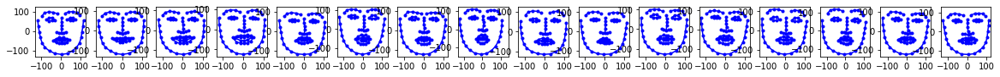

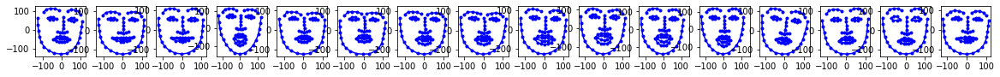

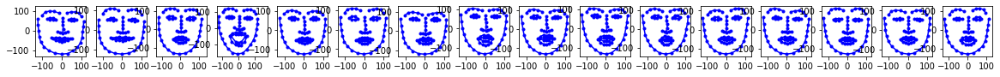

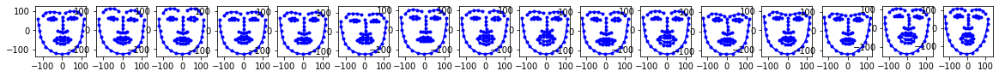

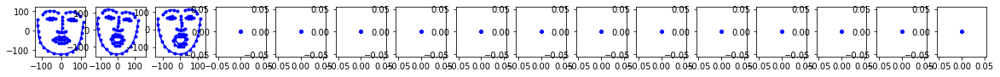

In [23]:
MyPlot.plot_all(app1.X)

## Register to natural image A (app1)

Blue : Unregistered

Red : Registered 

In [25]:
# MyPlot.diff_plot_all(app1.X, app1.similarity_X)
# MyPlot.diff_plot_all(app1.X, app1.affine_X)

## Register to natural image A (app1)(Comparison between Affine and Similarity )

Blue : Similarity

Red : Affine

In [26]:
# MyPlot.diff_plot_all(app1.similarity_X, app1.affine_X)

## Register to natural image B (app2) 

Blue : Unregistered

Red : Registered 

In [27]:
# MyPlot.diff_plot_all(app2.X, app2.similarity_X)
# MyPlot.diff_plot_all(app2.X, app2.affine_X)

## Register to natural image B (app2)(Comparison between Affine and Similarity )

Blue : Similarity

Red : Affine

In [28]:
# MyPlot.diff_plot_all(app2.similarity_X, app2.affine_X)

## Comparison between 'Register to naural image A (app1)' and 'Register to natural image B (app2)'

blue: natural image A

red: natural image B

In [29]:
# MyPlot.diff_plot_all(app1.similarity_X, app2.similarity_X)
# MyPlot.diff_plot_all(app1.affine_X, app2.affine_X)

## Comparison Means

X_mean

similarity_X_mean_all

affine_X_mean_all

In [30]:
# MyPlot.diff_plot(app2.X_mean, app2.similarity_X_mean_all)
# MyPlot.diff_plot(app1.similarity_X_mean_all, app1.affine_X_mean_all)
# MyPlot.diff_plot(app2.similarity_X_mean_all, app2.affine_X_mean_all)

# Face models + Animating principal modes

phase 1 and 2 : Calculated in [Registration and The Average Shape]

In [31]:
pca = PCA(K=16)
pca.fit(app1.similarity_X)

## Animate principal components

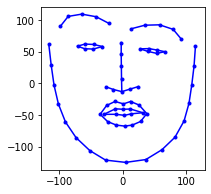

In [32]:
pca.animate(k=5)

# Transfering gestures

## Another person's gesture  (video)

In [33]:
mp4 = open(B_VIDEO,'rb').read()
decoded_vid = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f'<video width=400 controls><source src={decoded_vid} type="video/mp4"></video>')

0it [00:00, ?it/s]

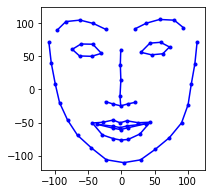

In [34]:
T = []
for b in tqdm(FaceDetector(FACE_LANDMARKS_FILE).iter_video_dots(B_VIDEO)):
    registered_b = app1.register(b, calc='similarity')
    transformed_b = pca.transform(registered_b)
    T.append(transformed_b)

MyPlot.animate_plot(T)

# Appearance model

In [35]:
size = 150
C = []
for t in tqdm(T):
    appearance = Appearance(
        from_x=app1.natural_X,
        from_x_image_file=A_NATURAL_IMG,
        old_from_x_mean=app1.natural_X_mean,
        to_x=t,
    )
    C.append(
        np.array([
            [appearance.get_color((j,i)) for j in range(-size, size)]
            for i in range(size, -size, -1)
        ])
    )



  0%|          | 0/273 [00:00<?, ?it/s]

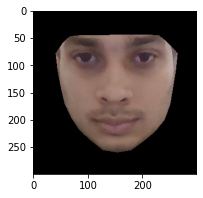

In [36]:
MyPlot.animate_imshow(C)